<a href="https://colab.research.google.com/github/mkeohane01/GAN-Image-Denoising/blob/denoise-gan-dev/notebooks/eval_gan_sidd_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lesson 7 - SuperResolution and GAN's

## Lesson Video:

In [ ]:
#hide
#Run once per session
#!pip install fastai wwf -q --upgrade

In [ ]:
#hide_input
#from wwf.utils import state_versions
#state_versions(['fastai', 'fastcore', 'wwf'])

## What is a GAN?
The Generative Adversarial Network was invented by Ian Goodfellow, where two networks play a game. In our case, we will build a 'crappifier' to make images worse, and the critic will try to determine which is fake and which is the original. This will help us achieve super-resolution

In [1]:
from fastai.vision.all import *
from fastai.vision.gan import *

## Import data

Let's import the data and format

In [2]:
from PIL import ImageDraw, ImageFont

In [3]:
colab = True
if colab == True:
    !pip install kaggle
    from google.colab import files
    files.upload()

    # Download kaggle dataset
    !mkdir ~/.kaggle
    !cp kaggle.json ~/.kaggle/

    # Small dataset
    !kaggle datasets download -d rajat95gupta/smartphone-image-denoising-dataset


Saving kaggle.json to kaggle.json
100% 6.16G/6.16G [03:45<00:00, 30.9MB/s]
100% 6.16G/6.16G [03:45<00:00, 29.4MB/s]


In [4]:
# Unzip the smartphone denoising dataset
if colab == True:
    !unzip '/content/smartphone-image-denoising-dataset.zip'

Archive:  /content/smartphone-image-denoising-dataset.zip
  inflating: SIDD_Small_sRGB_Only/Data/0001_001_S6_00100_00060_3200_L/GT_SRGB_010.PNG  
  inflating: SIDD_Small_sRGB_Only/Data/0001_001_S6_00100_00060_3200_L/NOISY_SRGB_010.PNG  
  inflating: SIDD_Small_sRGB_Only/Data/0002_001_S6_00100_00020_3200_N/GT_SRGB_010.PNG  
  inflating: SIDD_Small_sRGB_Only/Data/0002_001_S6_00100_00020_3200_N/NOISY_SRGB_010.PNG  
  inflating: SIDD_Small_sRGB_Only/Data/0003_001_S6_00100_00060_3200_H/GT_SRGB_010.PNG  
  inflating: SIDD_Small_sRGB_Only/Data/0003_001_S6_00100_00060_3200_H/NOISY_SRGB_010.PNG  
  inflating: SIDD_Small_sRGB_Only/Data/0004_001_S6_00100_00060_4400_L/GT_SRGB_010.PNG  
  inflating: SIDD_Small_sRGB_Only/Data/0004_001_S6_00100_00060_4400_L/NOISY_SRGB_010.PNG  
  inflating: SIDD_Small_sRGB_Only/Data/0005_001_S6_00100_00060_4400_N/GT_SRGB_010.PNG  
  inflating: SIDD_Small_sRGB_Only/Data/0005_001_S6_00100_00060_4400_N/NOISY_SRGB_010.PNG  
  inflating: SIDD_Small_sRGB_Only/Data/0006_001

In [6]:
import os
import shutil

# Function to load image pairs from a folder
def load_image_pairs(folder, output_folder='/kaggle/working/'):
    gt_folder = os.path.join(folder, 'gt')
    noisy_folder = os.path.join(folder, 'noisy')

    # Clear the contents of the gt_folder and noisy_folder if they exist
    if os.path.exists(gt_folder):
        shutil.rmtree(gt_folder)
    if os.path.exists(noisy_folder):
        shutil.rmtree(noisy_folder)

    if not os.path.exists(gt_folder):
        os.makedirs(gt_folder)
        print('created gt: ', gt_folder)
    if not os.path.exists(noisy_folder):
        os.makedirs(noisy_folder)
        print('created noisy: ', noisy_folder)

    for i, (root, dirs, files) in enumerate(os.walk(folder)):
        if root == gt_folder or root == noisy_folder:
            continue  # Skip the gt_folder and noisy_folder
        for file in files:
            if 'GT' in file:
                filename, ext = os.path.splitext(file)
                new_filename = f"{'_'.join(filename.split('_')[1:])}_{i}{ext}"
                shutil.move(os.path.join(root, file), os.path.join(gt_folder, new_filename))
            elif 'NOISY' in file:
                filename, ext = os.path.splitext(file)
                new_filename = f"{'_'.join(filename.split('_')[1:])}_{i}{ext}"
                shutil.move(os.path.join(root, file), os.path.join(noisy_folder, new_filename))

    gt_images = [os.path.join(gt_folder, file) for file in os.listdir(gt_folder)]
    noisy_images = [os.path.join(noisy_folder, file) for file in os.listdir(noisy_folder)]

    print("Number of images in 'gt' folder:", len(gt_images))
    print("Number of images in 'noisy' folder:", len(noisy_images))

    return gt_images, noisy_images

# Load image pairs from the folder
gt_images, noisy_images = load_image_pairs('/content/SIDD_Small_sRGB_Only/Data')

created gt:  /content/SIDD_Small_sRGB_Only/Data/gt
created noisy:  /content/SIDD_Small_sRGB_Only/Data/noisy
Number of images in 'gt' folder: 160
Number of images in 'noisy' folder: 160


We'll make two folders, one for the low resolution (LR) and high resolution (HR) photos:

In [22]:
path = Path('/content/SIDD_Small_sRGB_Only/Data')
path_hr = path/'gt'
path_lr = path/'noisy'

In [8]:
path_hr

Path('/kaggle/working/gt')

## Now let's generate our dataset! Crappify images

In [ ]:
#from crappify import *

In [ ]:
from PIL import ImageDraw, ImageFont

In [ ]:
def resize_to(img, targ_sz, use_min=False):
    w,h = img.size
    min_sz = (min if use_min else max)(w,h)
    ratio = targ_sz/min_sz
    return int(w*ratio),int(h*ratio)

class Crappifier():
  "Quickly draw tesxt and numbers on an image"
  def __init__(self, path_lr, path_hr):
      self.path_lr = path_lr
      self.path_hr = path_hr

  def __call__(self, fn):
      dest = self.path_lr/fn.relative_to(self.path_hr)
      dest.parent.mkdir(parents=True, exist_ok=True)
      img = Image.open(fn)
      targ_sz = resize_to(img, 96, use_min=True)
      img = img.resize(targ_sz, resample=Image.BILINEAR).convert('RGB')
      w,h = img.size
      q = random.randint(10,70)
      ImageDraw.Draw(img).text((random.randint(0,w//2),random.randint(0,h//2)), str(q), fill=(255,255,255))
      img.save(dest, quality=q)

In [ ]:
print(len(get_image_files(path_hr)))
print(len(get_image_files(path_lr)))

160

160


Let's take a look at one of our generated images:

In [ ]:
items = get_image_files(path_hr)

In [ ]:
#parallel(Crappifier(path_lr, path_hr), items);

In [ ]:
bad_im = get_image_files(path_lr)

In [ ]:
im1 = PILImage.create(items[0])
im2 = PILImage.create(bad_im[0])

original

bad


<Axes: >

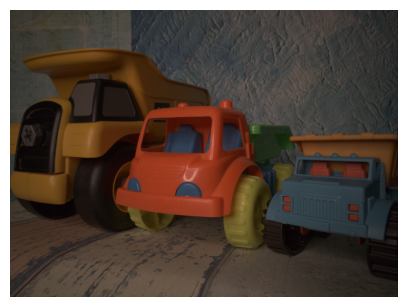

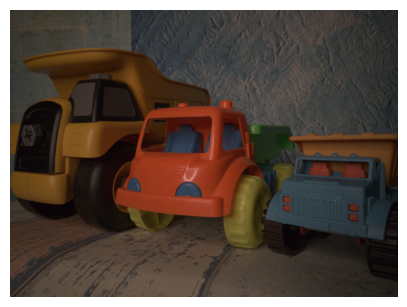

In [ ]:
print('original')
im1.show();
print('bad')
im2.show(figsize=(5,5))

Great! We have some data now! Let's build the `DataBlock`

## DataBlock

In [18]:
dblock = DataBlock(blocks=(ImageBlock, ImageBlock),
                   get_items=get_image_files,
                   get_y = lambda x: path_hr/x.name,
                   splitter=RandomSplitter(),
                   item_tfms=Resize(224),
                   batch_tfms=[*aug_transforms(max_zoom=2.),
                               Normalize.from_stats(*imagenet_stats)])

But for today's lesson, we'll go back to that progressive resizing technique we talked about. We want a function that can accept a `batch_size` and a `im_size`. Let's build that:

In [ ]:
path_hr

Path('/content/SIDD_Small_sRGB_Only/Data/gt')

In [19]:
def get_dls(bs:int, size:int):
  "Generates two `GAN` DataLoaders"
  dblock = DataBlock(blocks=(ImageBlock, ImageBlock),
                   get_items=get_image_files,
                   get_y = lambda x: path_hr/x.name,
                   splitter=RandomSplitter(),
                   item_tfms=Resize(size),
                   batch_tfms=[*aug_transforms(max_zoom=2.),
                               Normalize.from_stats(*imagenet_stats)])
  dls = dblock.dataloaders(path_lr, bs=bs, path=path)
  dls.c = 3 # For 3 channel image
  return dls

## Pre-Trained Generator

The goal of this model will be to generate our "Super Resolution" images (or to make an image look better)

In [9]:
IMAGE_SIZE = 512
BATCH_SIZE = 1

In [ ]:
dls_gen = get_dls(8, IMAGE_SIZE)

On the left will be our 'crappified' image, and the right our original

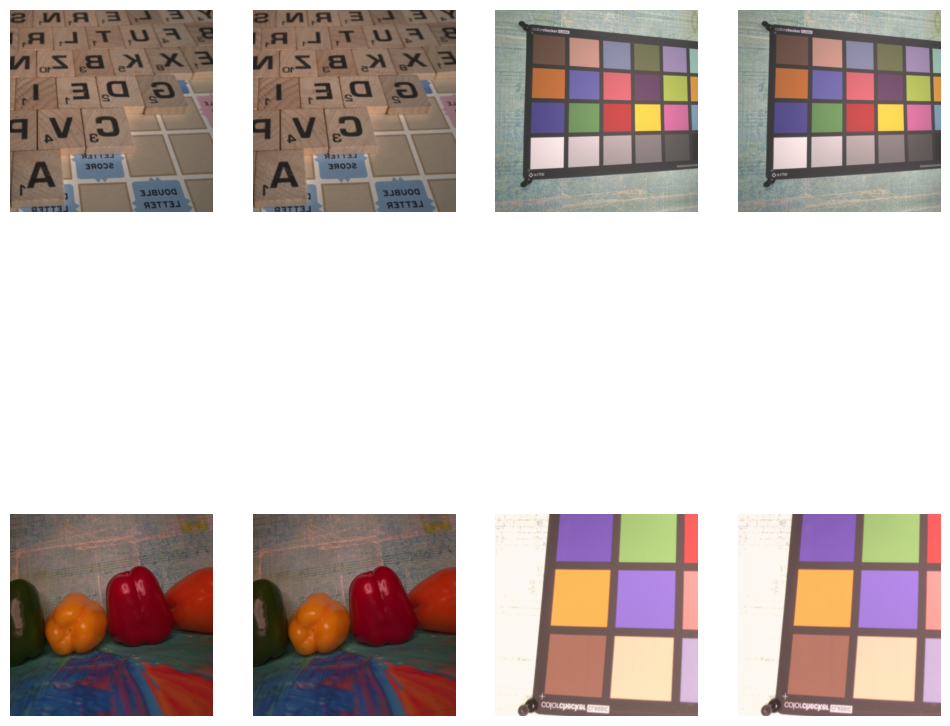

In [ ]:
dls_gen.show_batch(max_n=4, figsize=(12,12))

Now let's build some models (with recommended hyper-parameters)

In [17]:
wd, loss_gen = 1e-3, MSELossFlat()

For our backbone, we'll use a resnet34

In [10]:
from fastai.vision.learner import unet_learner
from fastai.vision.all import *
from fastai.vision.models.unet import *

In [11]:
bbone = resnet34
#cfg = unet_config(blur=True, norm_type=NormType.Weight, self_attention=True,
#                  y_range=y_range)

In [ ]:
def create_gen_learner():
  return unet_learner(dls_gen, bbone, loss_func=loss_gen, blur=True, norm_type=NormType.Weight, self_attention=True)

In [ ]:
learn_gen = create_gen_learner()

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth

100%|██████████| 83.3M/83.3M [00:00<00:00, 139MB/s]

/usr/local/lib/python3.10/dist-packages/torch/nn/utils/weight_norm.py:28: UserWarning: torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.

  warnings.warn("torch.nn.utils.weight_norm is deprecated in favor of torch.nn.utils.parametrizations.weight_norm.")


Let's fit our model quickly (we don't need to train for very long)

In [ ]:
learn_gen.fit_one_cycle(2, wd=wd)

epoch,train_loss,valid_loss,time
0,2.246153,0.147863,00:39
1,1.035476,0.095267,00:36


Let's unfreeze and fit a bit more!

In [ ]:
learn_gen.unfreeze()

In [ ]:
learn_gen.fit_one_cycle(3, slice(1e-6,1e-3), wd=wd)

epoch,train_loss,valid_loss,time
0,0.081374,0.036179,00:37
1,0.046698,0.014961,00:36
2,0.033359,0.012073,00:36


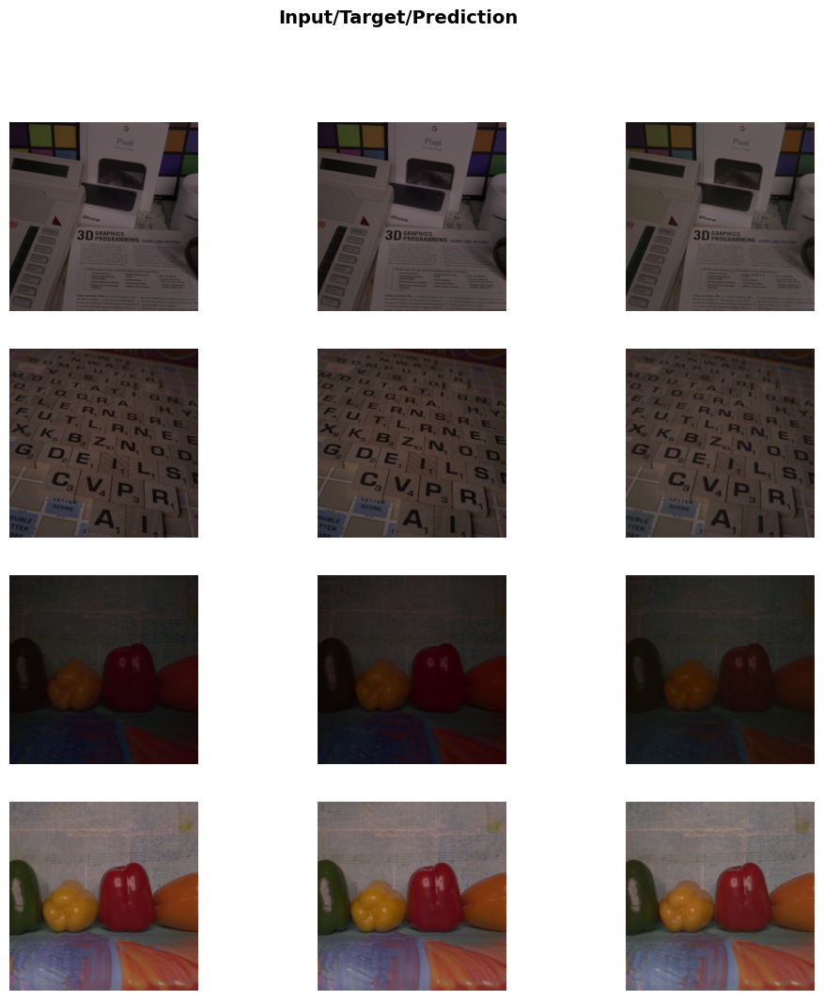

In [ ]:
learn_gen.show_results(max_n=4, figsize=(12,12))

In [ ]:
learn_gen.save('gen-pre2')

Path('/content/SIDD_Small_sRGB_Only/Data/models/gen-pre2.pth')

## Save the generated images

Now we need these generated images saved away so we can use them for our `critic` model. Let's do so:

In [ ]:
name_gen = 'image_gen'
path_gen = path/name_gen

In [ ]:
path_gen.mkdir(exist_ok=True)

In [ ]:
def save_preds(dl, learn):
  "Save away predictions"
  names = dl.dataset.items

  preds,_ = learn.get_preds(dl=dl)
  for i,pred in enumerate(preds):
      dec = dl.after_batch.decode((TensorImage(pred[None]),))[0][0]
      arr = dec.numpy().transpose(1,2,0).astype(np.uint8)
      Image.fromarray(arr).save(path_gen/names[i].name)

We'll want to get rid of any augmentation, `drop_last`, and `shuffle` from our training `DataLoader`:

In [ ]:
dl = dls_gen.train.new(shuffle=False, drop_last=False,
                       after_batch=[IntToFloatTensor, Normalize.from_stats(*imagenet_stats)])

Now let's look at what we're actually doing

In [ ]:
preds, _ = learn_gen.get_preds(dl=dl)

In [ ]:
preds[0].shape

torch.Size([3, 512, 512])

In [ ]:
preds[0][None].shape

torch.Size([1, 3, 512, 512])

In [ ]:
dec = dl.after_batch.decode((TensorImage(preds[0][None]),))[0][0]

In [ ]:
arr = dec.numpy().transpose(1,2,0)

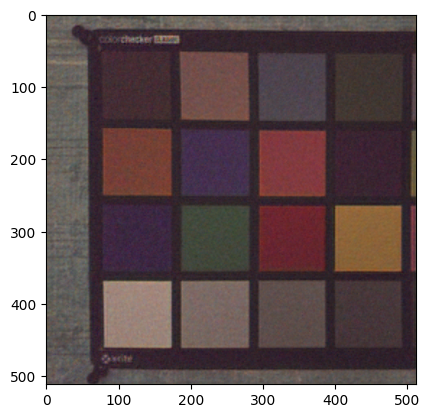

In [ ]:
plt.imshow(arr.astype(np.uint8))

Now let's go save it away.

In [ ]:
save_preds(dl, learn_gen)

## Training the critic

Now let's build our critic model

In [12]:
path_gen

NameError: name 'path_gen' is not defined

In [ ]:
name_gen

'image_gen'

In [ ]:
# We have to do this because of a bug for right now
path_g = get_image_files(path/name_gen)
path_i = get_image_files(path/'gt')
fnames = path_g + path_i

In [ ]:
fnames[0]

Path('/content/SIDD_Small_sRGB_Only/Data/image_gen/SRGB_010_94.PNG')

In [ ]:
def get_crit_dls(fnames, bs:int, size:int):
  "Generate two `Critic` DataLoaders"
  splits = RandomSplitter(0.1)(fnames)
  dsrc = Datasets(fnames, tfms=[[PILImage.create], [parent_label, Categorize]],
                 splits=splits)
  tfms = [ToTensor(), Resize(size)]
  gpu_tfms = [IntToFloatTensor(), Normalize.from_stats(*imagenet_stats)]
  return dsrc.dataloaders(bs=bs, after_item=tfms, after_batch=gpu_tfms)

In [ ]:
dls_crit = get_crit_dls(fnames, bs=8, size=IMAGE_SIZE)

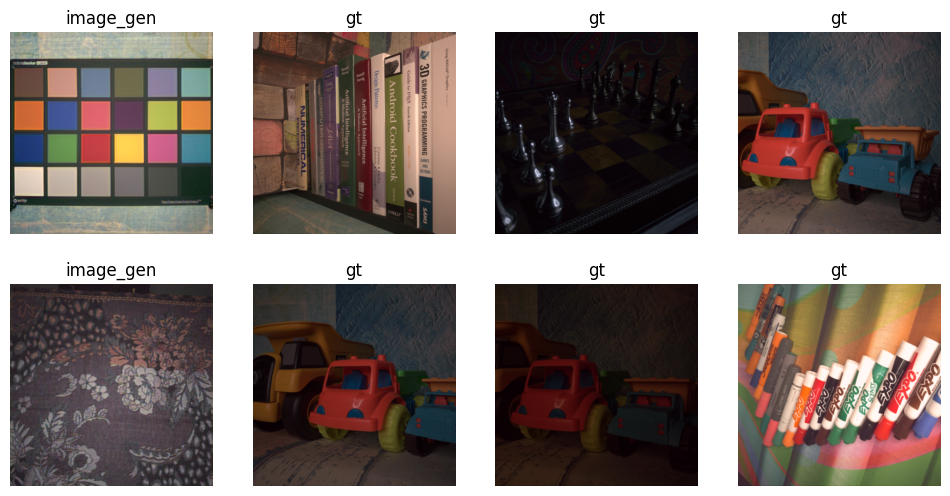

In [ ]:
dls_crit.show_batch()

In [ ]:
loss_crit = AdaptiveLoss(nn.BCEWithLogitsLoss())

In [ ]:
def create_crit_learner(dls, metrics):
  return Learner(dls, gan_critic(), metrics=metrics, loss_func=loss_crit)

In [ ]:
learn_crit = create_crit_learner(dls_crit, accuracy_thresh_expand)

And now let's fit!

In [ ]:
learn_crit.fit_one_cycle(6, 1e-3, wd=wd)

In [ ]:
learn_crit.save('critic-pre2')

## The GAN

Now we'll combine the two models together into a gan

In [ ]:
ls_crit = get_crit_dls(fnames, bs=8, size=IMAGE_SIZE)

In [ ]:
learn_crit = create_crit_learner(dls_crit, metrics=True).load('critic-pre2')

In [ ]:
learn_gen = create_gen_learner().load('gen-pre2')

The last thing to do is to define our GAN. We are going to do this from_learners, and specifiy which is the generator and which is the critic. The switcher is a callback that decides **when to switch from one to another**.

Here, we will do as many iterations of the discrimitor as needed until its loss is back to <0.65 then do an iteration of generator.

The loss function of the critic is learn_crit's loss function. We take the average on the batch of real (targ 1) and fake (targ 0) predictions.

The loss function of the generator is a weighted sum of the learn_crit.loss_func on the **fake** image batch with a target of 1, and learn_gen.loss_func is applied to the output and target, batch of fake and batch of super-res images.

In [ ]:
class GANDiscriminativeLR(Callback):
    "`Callback` that handles multiplying the learning rate by `mult_lr` for the critic."
    def __init__(self, mult_lr=5.): self.mult_lr = mult_lr

    def begin_batch(self):
        "Multiply the current lr if necessary."
        if not self.learn.gan_trainer.gen_mode and self.training:
            self.learn.opt.set_hyper('lr', learn.opt.hypers[0]['lr']*self.mult_lr)

    def after_batch(self):
        "Put the LR back to its value if necessary."
        if not self.learn.gan_trainer.gen_mode: self.learn.opt.set_hyper('lr', learn.opt.hypers[0]['lr']/self.mult_lr)

Let's make our switcher and the `GANLearner`

In [ ]:
switcher = AdaptiveGANSwitcher()

In [ ]:
learn = GANLearner.from_learners(learn_gen, learn_crit, weights_gen=(1.,50.), show_img=True, switcher=switcher,
                                 opt_func=partial(Adam, mom=0.), cbs=GANDiscriminativeLR(mult_lr=5.))

In [ ]:
lr = 1e-4

And fit!

In [ ]:
learn.fit(10, lr, wd=wd)

In [ ]:
learn.show_results(max_n=4)

In [ ]:
# Copy contents in session to google drive

In [31]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp -r '/content/models' '/content/drive/MyDrive/AIPI 590: Computer Vision/sidd-fastai-noisy/'

In [ ]:
!cp -r '/content/SIDD_Small_sRGB_Only/Data/models' '/content/drive/MyDrive/AIPI 590: Computer Vision/sidd-fastai-noisy/'

# Evaluation

In [13]:
from math import log10, sqrt
from skimage.metrics import structural_similarity as ssim
import cv2

In [14]:
# Function to compute PSNR
def calculate_psnr(true_image, denoised_image):
    mse = np.mean((true_image - denoised_image) ** 2)
    if mse == 0:  # MSE is zero means no noise is present in the signal.
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr

# Function to compute SSIM
def calculate_ssim(true_image, denoised_image):
    ssim_value = ssim(true_image, denoised_image, channel_axis=2)
    return ssim_value

def postprocess_tensor(image_tensor):
    # Denormalize using the mean and std used for normalization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image_tensor = image_tensor.detach().squeeze(0)  # Remove batch dimension
    image_np = image_tensor.numpy().transpose((1, 2, 0))  # Convert to (H, W, C)
    image_np = std * image_np + mean  # Denormalize
    image_np = np.clip(image_np, 0, 1)  # Ensure values are within [0, 1]
    image_np = (image_np * 255).astype(np.uint8)  # Convert to [0, 255] uint8
    return image_np

def display_images_and_calc_metrics(noisy_image, denoised_image, true_image, display=True):
    # Display the images
    if display:
      fig, axs = plt.subplots(1, 3, figsize=(15, 5))
      axs[0].imshow(noisy_image)
      axs[0].set_title('Noisy Image')
      axs[0].axis('off')

      axs[1].imshow(denoised_image)
      axs[1].set_title('Denoised Image')
      axs[1].axis('off')

      axs[2].imshow(true_image)
      axs[2].set_title('True Image')
      axs[2].axis('off')

      plt.show()

    # Calculate and print metrics
    # Ensure images are numpy arrays for metric calculations
    true_image_np = np.array(true_image)
    denoised_image_np = np.array(denoised_image)
    noisy_image_np = np.array(noisy_image)

    psnr_value = calculate_psnr(true_image_np, noisy_image_np)
    ssim_value = calculate_ssim(true_image, noisy_image)
    print(f"Noisy PSNR: {psnr_value:.2f}")
    print(f"Noisy SSIM: {ssim_value:.4f}")
    denoised_psnr = calculate_psnr(true_image_np, denoised_image_np)
    denoised_ssim = calculate_ssim(true_image_np, denoised_image_np)
    print(f"Gen PSNR: {denoised_psnr}")
    print(f"Gen SSIM: {denoised_ssim}")

    return psnr_value, ssim_value, denoised_psnr, denoised_ssim

In [15]:
# Connect to google drive
#Setup Gdrive file download extention
!conda install -y gdown

# Download
!gdown --id 1-5sr7-Cu4ptar4Z8qaGEDsMJKePf0EcM

/bin/bash: line 1: conda: command not found
/usr/local/lib/python3.10/dist-packages/gdown/cli.py:138: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1-5sr7-Cu4ptar4Z8qaGEDsMJKePf0EcM
From (redirected): https://drive.google.com/uc?id=1-5sr7-Cu4ptar4Z8qaGEDsMJKePf0EcM&confirm=t&uuid=5ebed4ef-ba7f-4a36-bc23-22f334de1c35
To: /content/gen-pre2.pth
100% 497M/497M [00:03<00:00, 162MB/s]


In [23]:
def get_dls(bs:int, size:int):
  "Generates two `GAN` DataLoaders"
  dblock = DataBlock(blocks=(ImageBlock, ImageBlock),
                   get_items=get_image_files,
                   get_y = lambda x: path_hr/x.name,
                   splitter=RandomSplitter(),
                   item_tfms=Resize(size),
                   batch_tfms=[*aug_transforms(max_zoom=2.),
                               Normalize.from_stats(*imagenet_stats)])
  dls = dblock.dataloaders(path_lr, bs=bs, path=path)
  dls.c = 3 # For 3 channel image
  return dls

dls_gen_eval = get_dls(BATCH_SIZE, IMAGE_SIZE)

In [38]:
gan = torch.load('/content/drive/MyDrive/AIPI 590: Computer Vision/sidd-fastai-noisy-512-correct/models/gan-sidd-fastai-noisy-512.pth')

print(gan.keys())

# Load the generator and discriminator from the state dictionary
gen_dict = gan['model']
print(gen_dict.keys())

# Set both models to evaluation mode
# generator.eval()

dict_keys(['model', 'opt'])
odict_keys(['generator.layers.0.0.weight', 'generator.layers.0.1.weight', 'generator.layers.0.1.bias', 'generator.layers.0.1.running_mean', 'generator.layers.0.1.running_var', 'generator.layers.0.1.num_batches_tracked', 'generator.layers.0.4.0.conv1.weight', 'generator.layers.0.4.0.bn1.weight', 'generator.layers.0.4.0.bn1.bias', 'generator.layers.0.4.0.bn1.running_mean', 'generator.layers.0.4.0.bn1.running_var', 'generator.layers.0.4.0.bn1.num_batches_tracked', 'generator.layers.0.4.0.conv2.weight', 'generator.layers.0.4.0.bn2.weight', 'generator.layers.0.4.0.bn2.bias', 'generator.layers.0.4.0.bn2.running_mean', 'generator.layers.0.4.0.bn2.running_var', 'generator.layers.0.4.0.bn2.num_batches_tracked', 'generator.layers.0.4.1.conv1.weight', 'generator.layers.0.4.1.bn1.weight', 'generator.layers.0.4.1.bn1.bias', 'generator.layers.0.4.1.bn1.running_mean', 'generator.layers.0.4.1.bn1.running_var', 'generator.layers.0.4.1.bn1.num_batches_tracked', 'generator.lay

In [25]:
def create_gen_learner():
  return unet_learner(dls_gen_eval, bbone, loss_func=loss_gen, blur=True, norm_type=NormType.Weight, self_attention=True)

learn_gen = create_gen_learner().load('/content/gen-pre2')

learn_gen.eval()

DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05

In [29]:
gen_image = learn_gen.predict('/content/SIDD_Small_sRGB_Only/Data/noisy/SRGB_010_1.PNG')

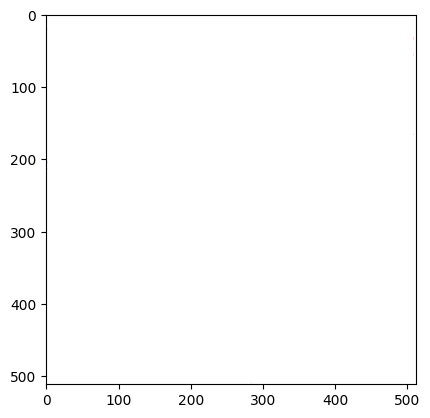

In [30]:
# display gen_image
gen_image = postprocess_tensor(gen_image[0])
plt.imshow(gen_image)
plt.show()

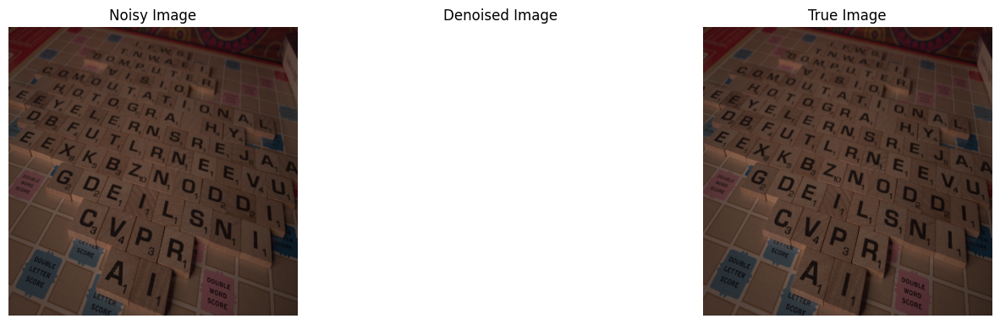

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.392149547720845
Gen SSIM: 0.2614345917450654


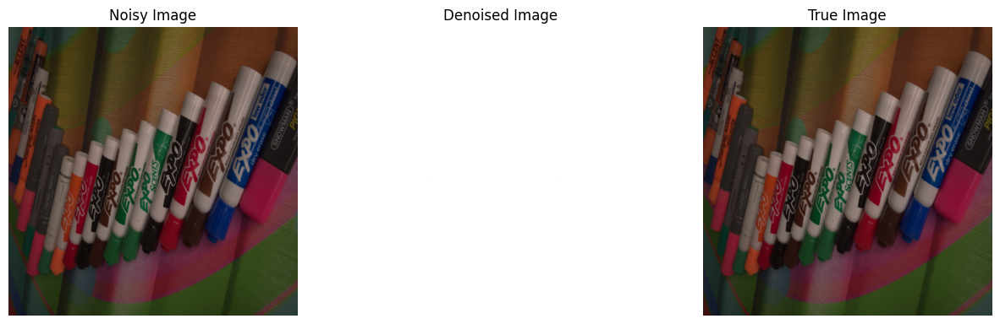

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.602676134182577
Gen SSIM: 0.23228375655615943


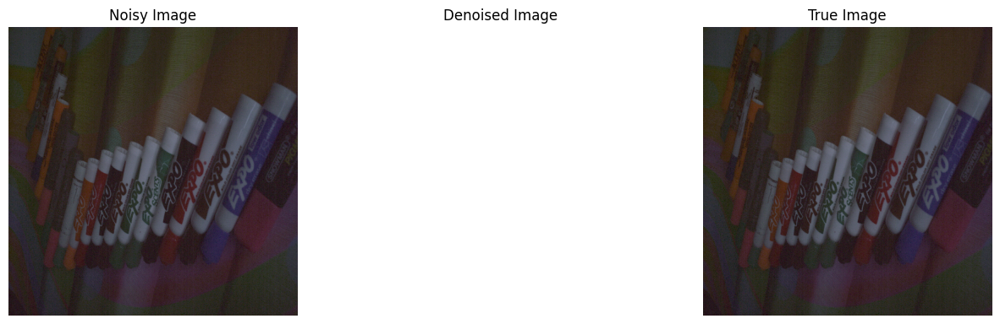

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.381921059918138
Gen SSIM: 0.21001885511719434


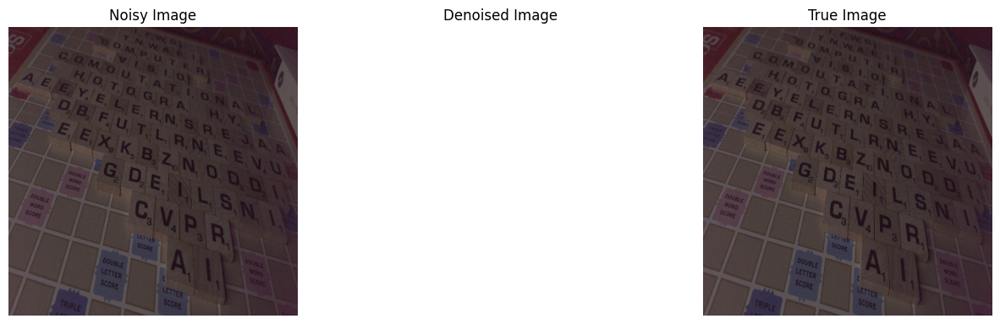

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.633156108867226
Gen SSIM: 0.26504712424518423


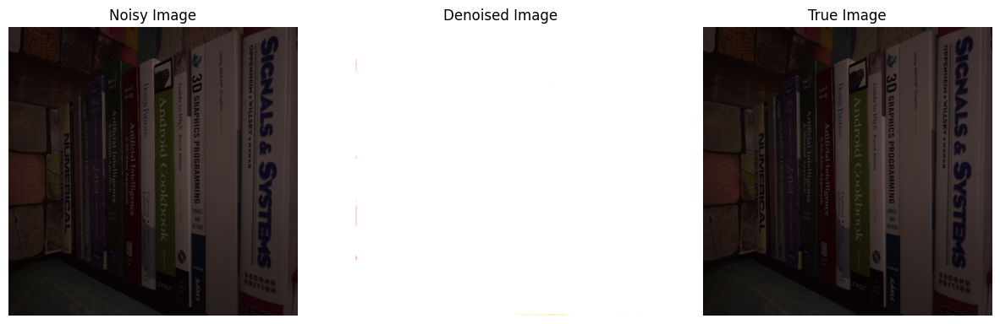

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.684942541689864
Gen SSIM: 0.1660556259659707


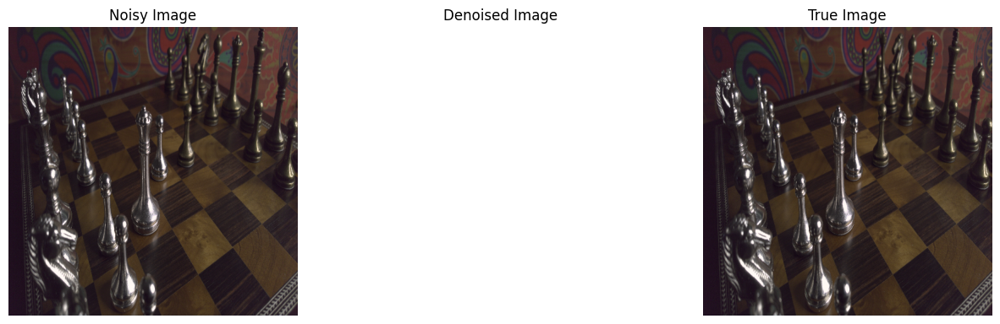

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.502808270383895
Gen SSIM: 0.18602630340644824


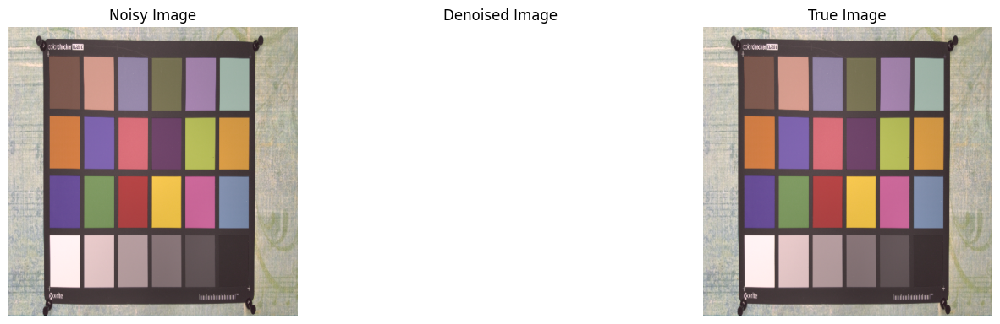

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.78966232972315
Gen SSIM: 0.4793182774382409


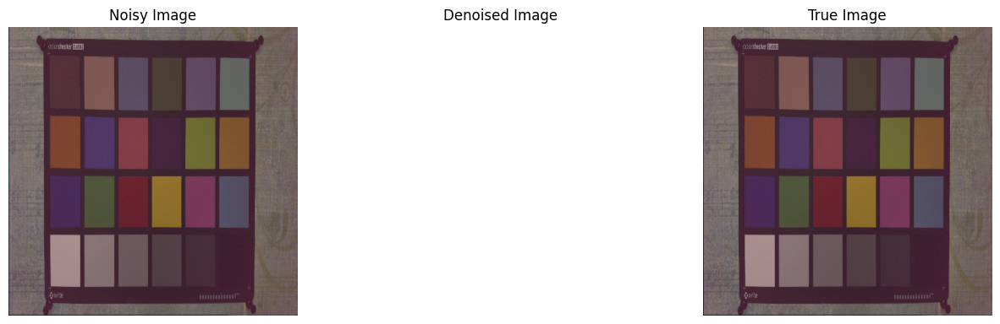

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.729549520051084
Gen SSIM: 0.4013394891501932


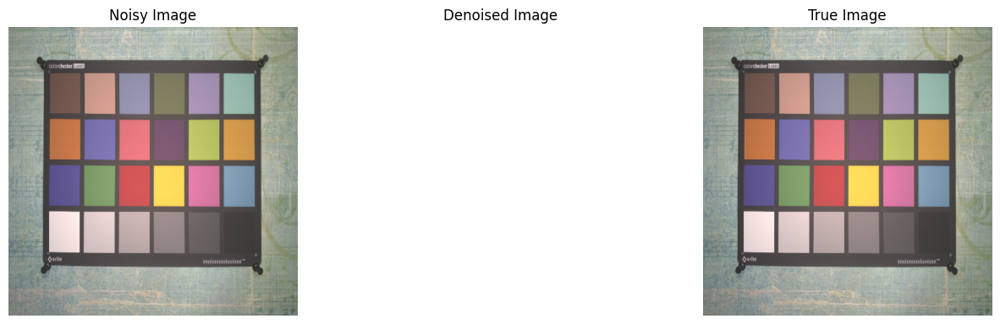

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.827523509518237
Gen SSIM: 0.5186171728991528


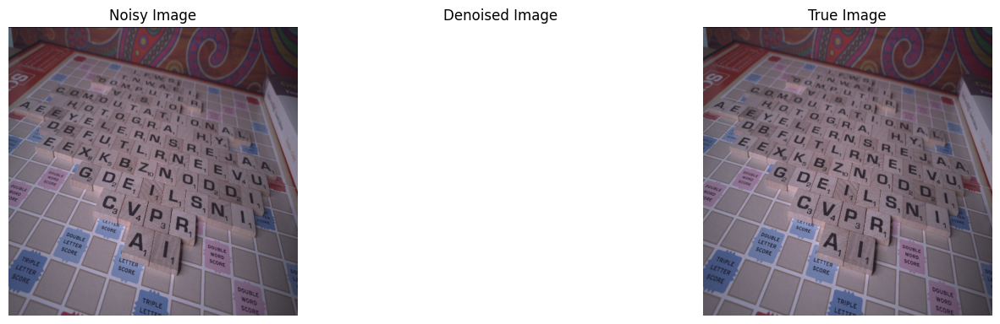

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 28.188375977459202
Gen SSIM: 0.31854283916092796


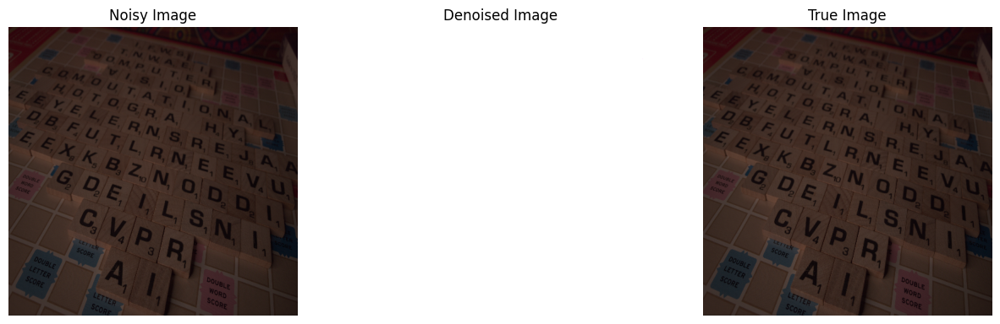

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.433008568074406
Gen SSIM: 0.22074015754961573


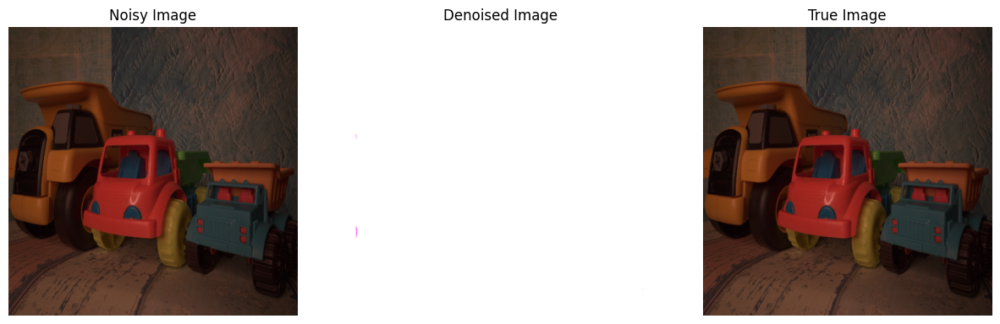

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.55168763084663
Gen SSIM: 0.2345497819186615


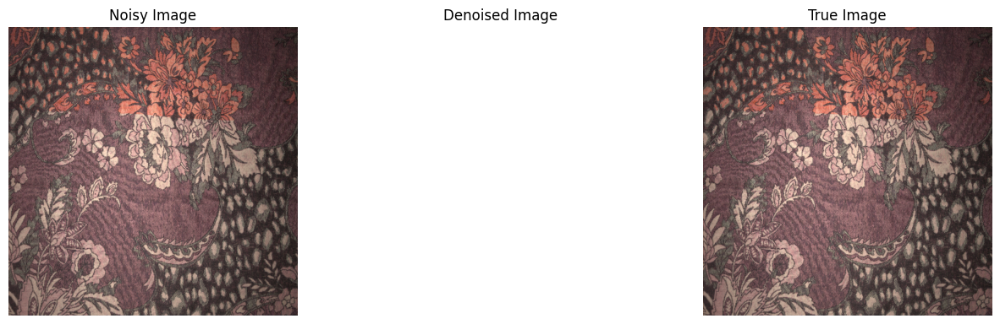

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.70422434698851
Gen SSIM: 0.09704666096258237


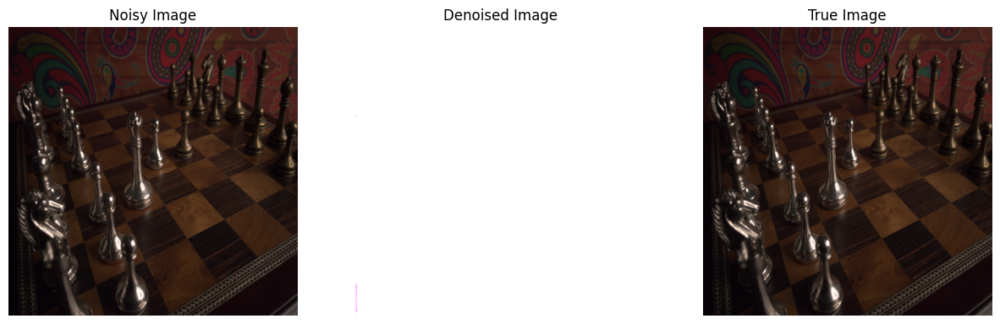

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.609456984002616
Gen SSIM: 0.13088092345603727


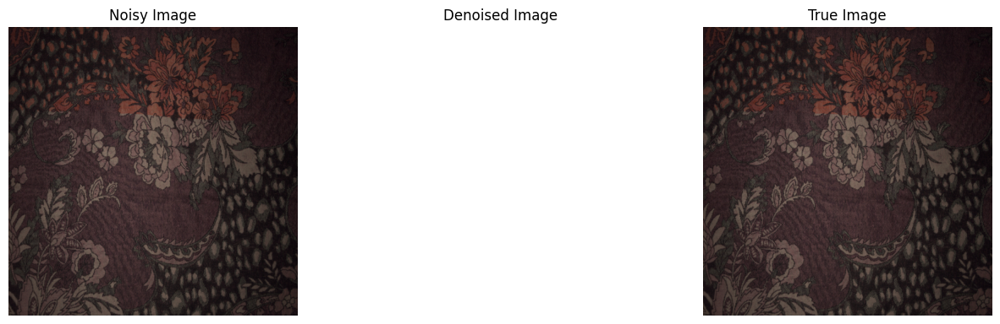

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.400507377601905
Gen SSIM: 0.12504244373518583


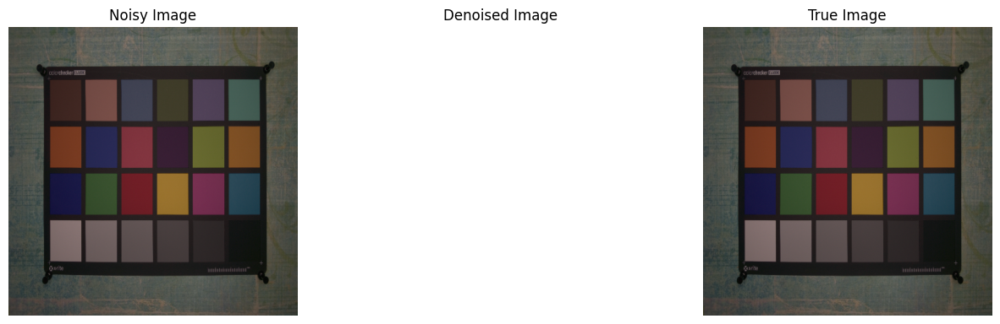

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.508460263189587
Gen SSIM: 0.35273773619608834


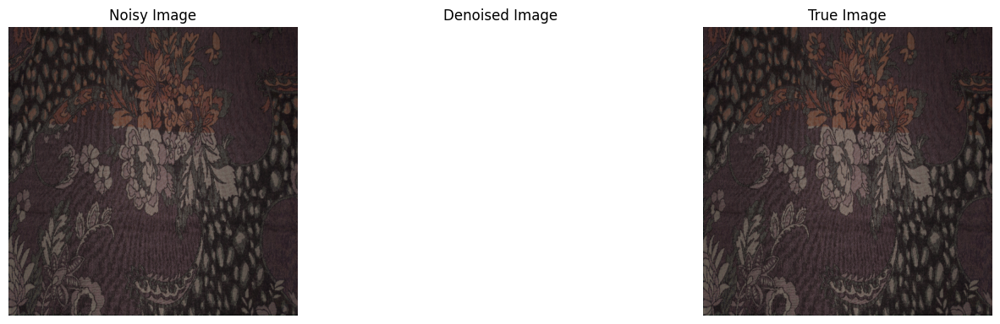

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.39108276051517
Gen SSIM: 0.12272137260864362


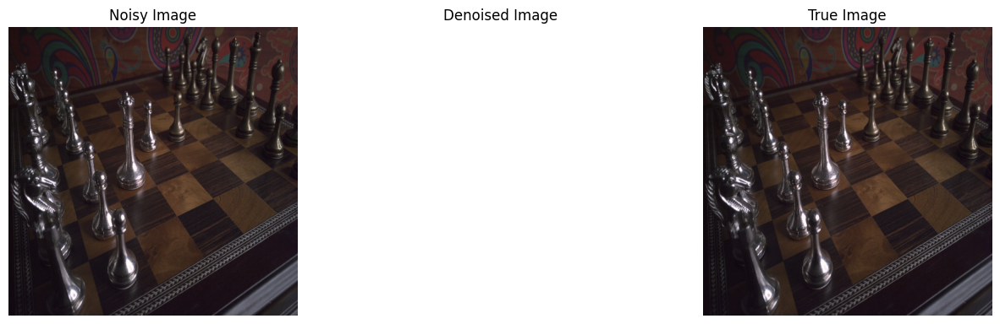

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.44998860284292
Gen SSIM: 0.16022950161694516


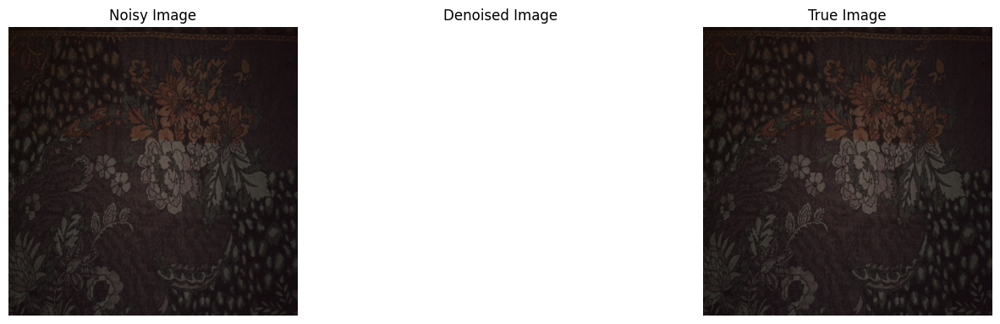

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.433989183497932
Gen SSIM: 0.12686823018542662


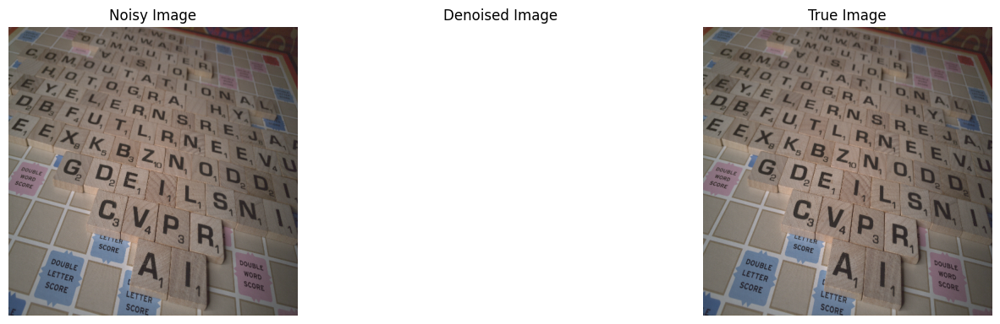

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 28.16269963856349
Gen SSIM: 0.3444198077994847


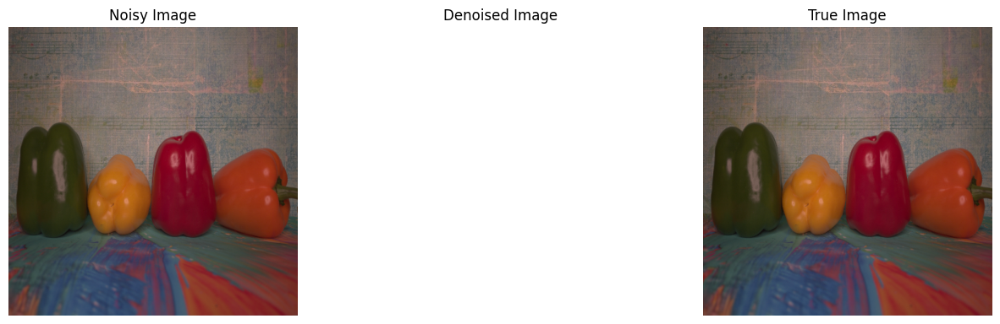

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.81745594000106
Gen SSIM: 0.38710789926885725


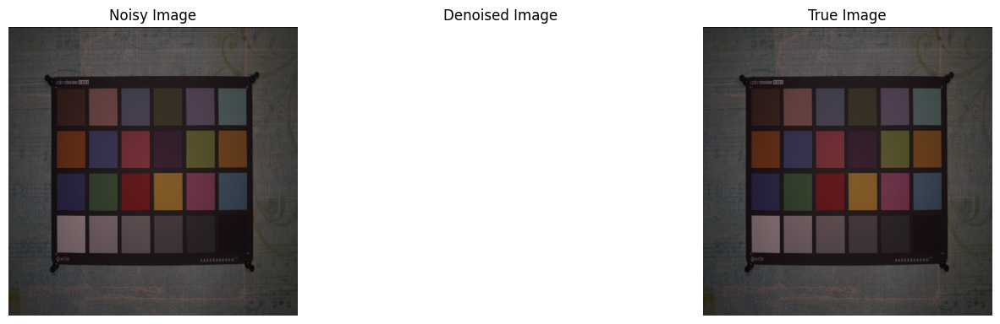

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.66587412421158
Gen SSIM: 0.32725178015913364


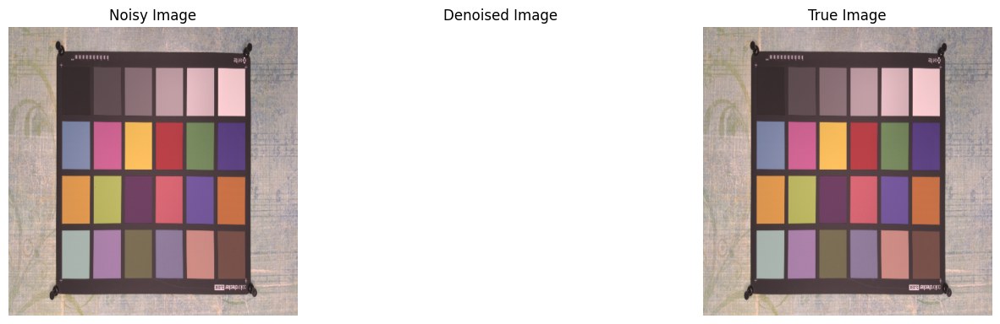

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.729841306927785
Gen SSIM: 0.47238375599718907


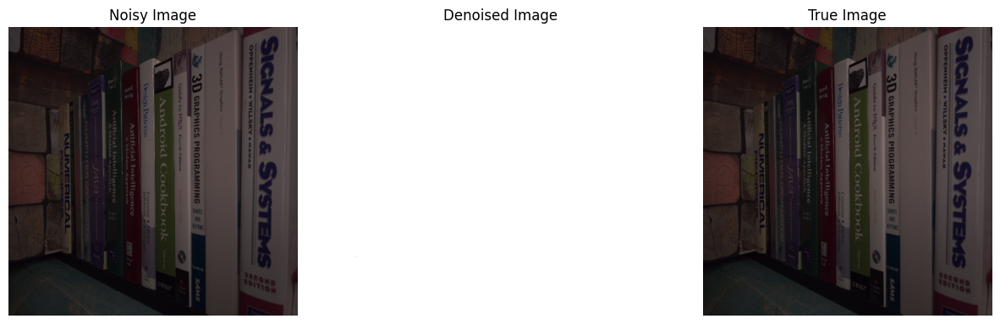

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.45319511836069
Gen SSIM: 0.2118185863691974


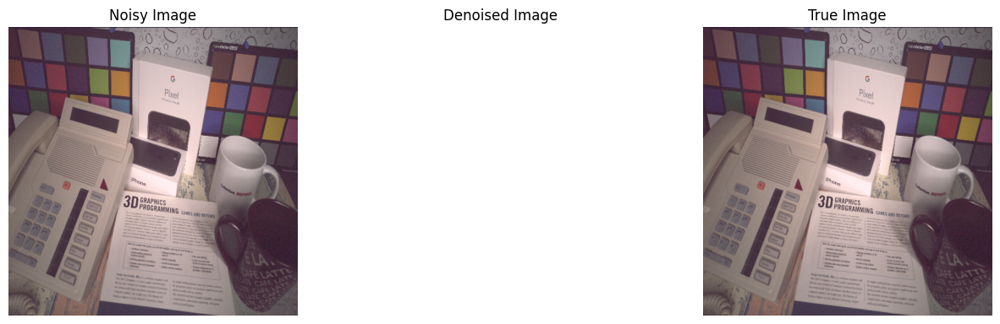

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.88056622497796
Gen SSIM: 0.35618402355561646


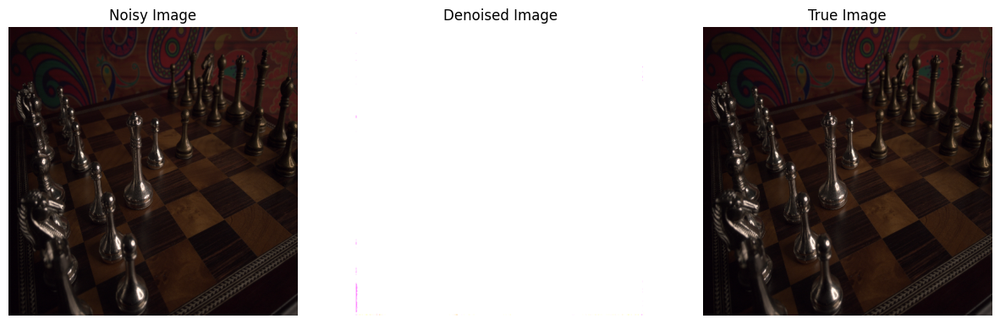

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.672697547201224
Gen SSIM: 0.11129481206741905


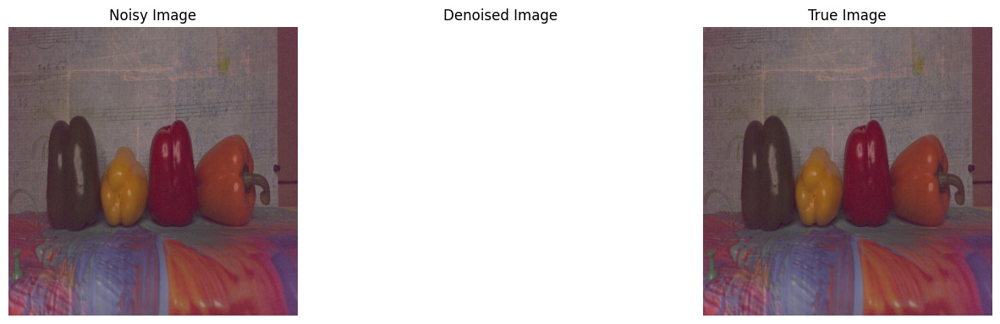

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.773164995336064
Gen SSIM: 0.3793312483587504


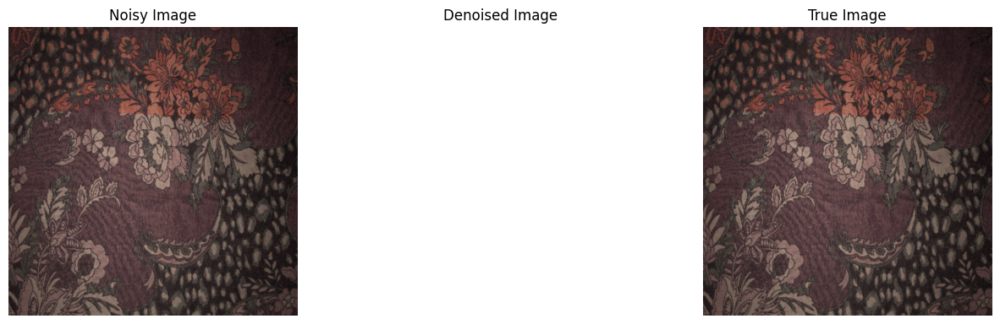

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.578652180700782
Gen SSIM: 0.12050530315181834


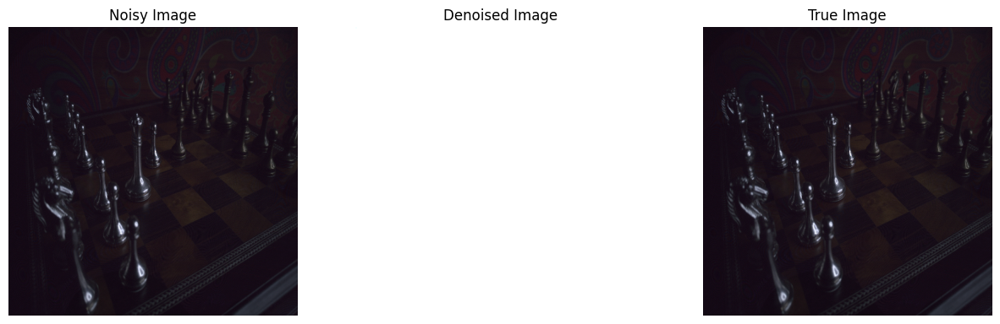

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.312970218247138
Gen SSIM: 0.14156562510219975


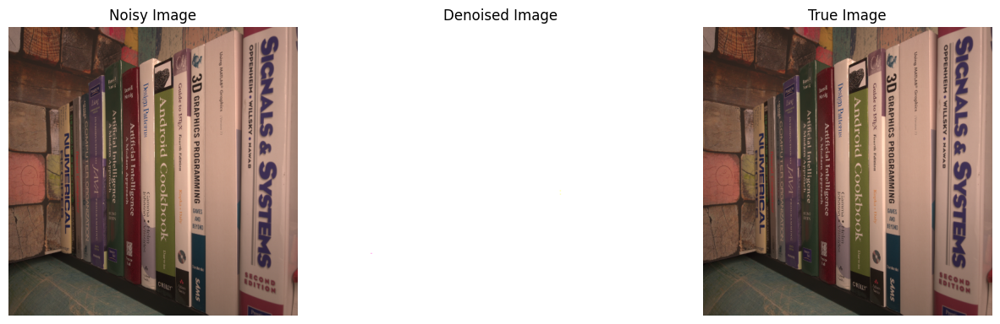

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.73116196950637
Gen SSIM: 0.31270816219773


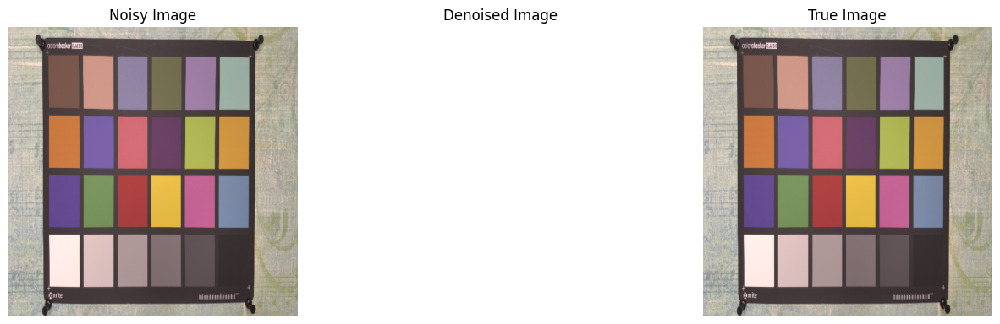

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 27.85922386856835
Gen SSIM: 0.48196797844306344


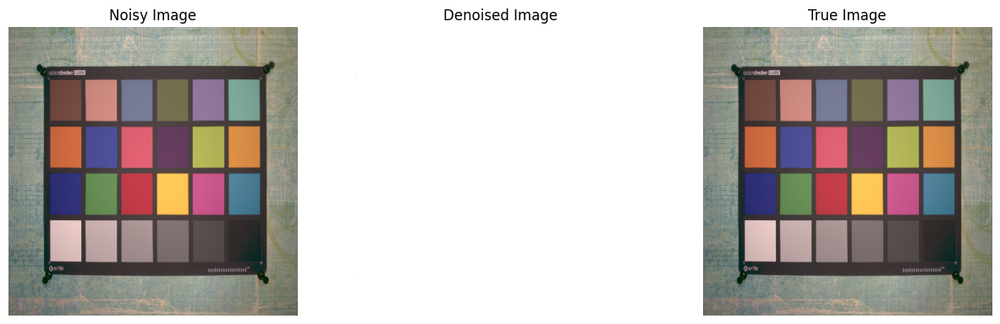

Noisy PSNR: 100.00
Noisy SSIM: 1.0000
Gen PSNR: 28.056093391750892
Gen SSIM: 0.4579952632308512


In [28]:
for batch_no, (noisy, gt) in enumerate(dls_gen_eval.valid.dataset):
    if batch_no >= 32:
        break

    gt_image = gt
    noisy_image = noisy

    # Generate denoised image
    gen_image = learn_gen.predict(noisy)
    gen_image = postprocess_tensor(gen_image[0])

    # Convert true image to numpy array
    gt_np = np.array(gt)
    # Resize the ground truth image to match denoised
    gt_resized = cv2.resize(gt_np, (512, 512), interpolation=cv2.INTER_LINEAR)

    # Convert noisy to numpy array
    noisy_gt = np.array(noisy)
    # Resize noisy to match denoised
    noisy_resized = cv2.resize(gt_np, (512, 512), interpolation=cv2.INTER_LINEAR)

    # Display the images and calculate metrics
    display_images_and_calc_metrics(noisy_resized, gen_image, gt_resized)